# Segment Anything Model (SAM)
## Интерактивная сегментация одним кликом

### План семинара:
1. Что такое SAM
2. Сегментация по точкам (point prompts)
3. Сегментация по боксам (box prompts)
4. Сегментация всего на изображении (automatic mask generation)
5. Комбинация промптов
6. Практическое применение

SAM: Модель обучена на 11 млн изображений и может сегментировать ЛЮБОЙ объект по простому указанию (клик, бокс, текст)!


In [2]:
# Установка библиотек
!pip install -q segment-anything opencv-python matplotlib numpy torch torchvision
from huggingface_hub import hf_hub_download
hf_hub_download("ybelkada/segment-anything", "checkpoints/sam_vit_b_01ec64.pth", local_dir="")
print("✅ Библиотеки установлены, модель скачана")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


checkpoints/sam_vit_b_01ec64.pth:   0%|          | 0.00/375M [00:00<?, ?B/s]

✅ Библиотеки установлены, модель скачана


In [3]:
# Импорт и настройка
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from segment_anything import SamPredictor, sam_model_registry, SamAutomaticMaskGenerator
from pathlib import Path
import requests
from PIL import Image
import io

# Настройка визуализации
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10

print("✅ Готово к работе!")

✅ Готово к работе!


## 1. Загрузка модели и изображения

In [3]:
# Инициализация SAM
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"🖥 Используем: {device}")

# Регистрируем модель (доступные: vit_h, vit_l, vit_b)
sam = sam_model_registry["vit_b"](checkpoint="checkpoints/sam_vit_b_01ec64.pth")
sam.to(device=device)
predictor = SamPredictor(sam)

print(f"✅ SAM загружен на {device}")

🖥 Используем: cuda
✅ SAM загружен на cuda


Размер изображения: (1200, 1800, 3)


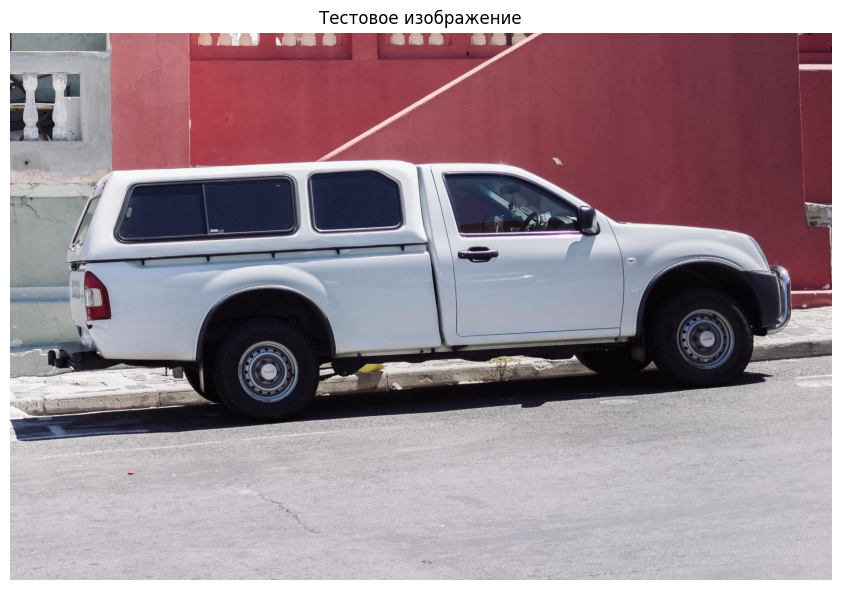

In [4]:
# Загружаем тестовое изображение
# Можно заменить на свое: image = cv2.imread("path/to/image.jpg")

url = "https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg"
response = requests.get(url)
image = np.array(Image.open(io.BytesIO(response.content)))

# Или загрузить свое изображение:
# image = cv2.imread("your_image.jpg")
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

print(f"Размер изображения: {image.shape}")

plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.axis("off")
plt.title("Тестовое изображение")
plt.tight_layout()
plt.show()

In [5]:
# Устанавливаем изображение в predictor (это нужно сделать один раз)
predictor.set_image(image)
print("✅ Изображение установлено в модель")

✅ Изображение установлено в модель


## 2. Сегментация по ТОЧКАМ (Point Prompts)

### Задание 2.1: Сегментация объекта по одной точке

Укажите координаты точки (x, y) внутри объекта, который хотите выделить.

Найдено масок: 3
Scores: [0.9052571  0.95115453 0.98385394]


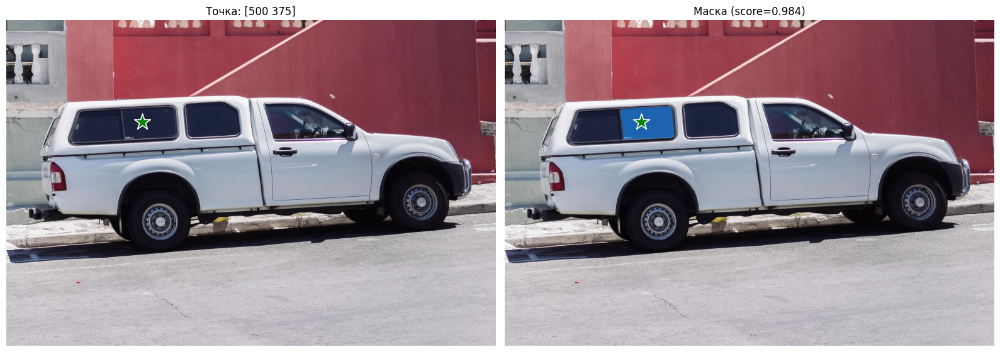

In [6]:
# Задаем точку (координаты x, y)
# Например, для грузовика: колесо, кабина, фара
input_point = np.array([[500, 375]])  # Координаты точки [x, y]
input_label = np.array([1])  # 1 = объект, 0 = фон

# Предсказание
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True  # Вернуть несколько вариантов
)

print(f"Найдено масок: {len(masks)}")
print(f"Scores: {scores}")

# Визуализация лучшей маски
best_mask_idx = np.argmax(scores)

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], c='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], c='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))

ax[0].imshow(image)
show_points(input_point, input_label, ax[0])
ax[0].set_title(f"Точка: {input_point[0]}", fontsize=12)
ax[0].axis("off")

ax[1].imshow(image)
show_mask(masks[best_mask_idx], ax[1])
show_points(input_point, input_label, ax[1])
ax[1].set_title(f"Маска (score={scores[best_mask_idx]:.3f})", fontsize=12)
ax[1].axis("off")

plt.tight_layout()
plt.show()

### 📝 Задание 2.2: Эксперимент с точками

Попробуйте:
1. Сегментировать колесо грузовика (поставьте точку на колесе)
2. Сегментировать кабину (точка на кабине)
3. Сегментировать фару (точка на фаре)
4. Попробуйте указать точку фона (label=0) и посмотрите, что произойдет

Вопросы для размышления:**
- Почему иногда SAM выдает несколько масок для одной точки?
- Как меняется результат в зависимости от расположения точки?

ЭКСПЕРИМЕНТ 1: Сегментация колеса


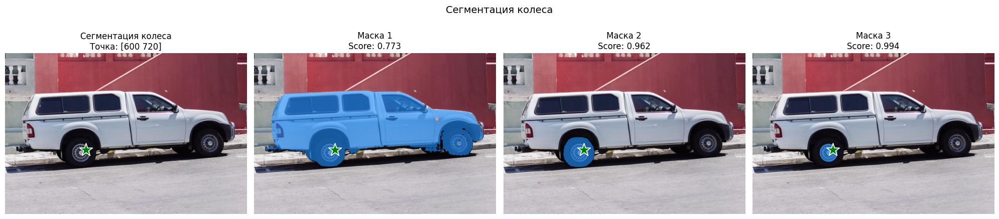


ЭКСПЕРИМЕНТ 2: Сегментация кабины


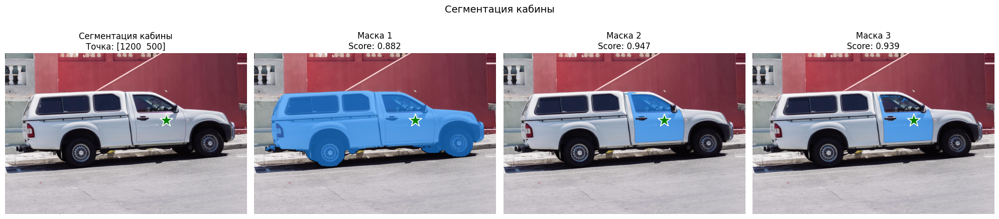


ЭКСПЕРИМЕНТ 3: Сегментация фары


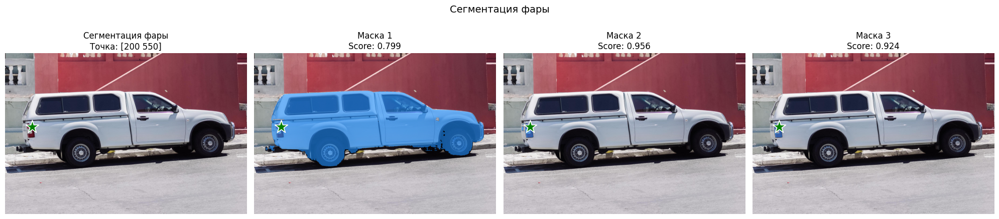


ЭКСПЕРИМЕНТ 4: Точка фона


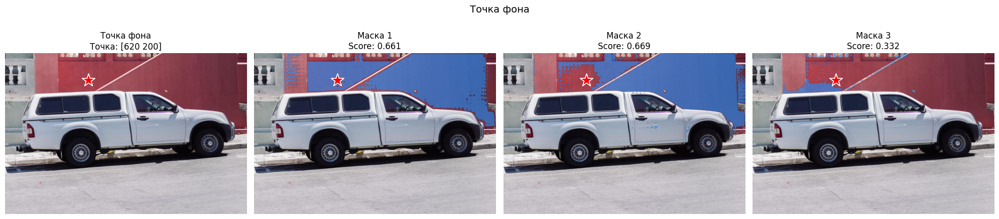

In [20]:
# 🎮 ВАШ КОД ЗДЕСЬ: Попробуйте разные точки
# Пример: точка на колесе (примерно [400, 450])

# input_point = np.array([[400, 450]])  # Измените координаты!
# input_label = np.array([1])

# masks, scores, logits = predictor.predict(
#     point_coords=input_point,
#     point_labels=input_label,
#     multimask_output=True
# )

# ... визуализация как выше ...

def segment_with_point(image, predictor, point_coords, point_label, title=""):
    masks, scores, logits = predictor.predict(
        point_coords=point_coords,
        point_labels=point_label,
        multimask_output=True
    )

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    # Исходное изображение с точкой
    axes[0].imshow(image)
    show_points(point_coords, point_label, axes[0])
    axes[0].set_title(f"{title}\nТочка: {point_coords[0]}", fontsize=12)
    axes[0].axis("off")

    # Показываем все 3 маски
    for i, (mask, score) in enumerate(zip(masks, scores)):
        axes[i+1].imshow(image)
        show_mask(mask, axes[i+1])
        show_points(point_coords, point_label, axes[i+1])
        axes[i+1].set_title(f"Маска {i+1}\nScore: {score:.3f}", fontsize=12)
        axes[i+1].axis("off")

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

    return masks, scores

# ЭКСПЕРИМЕНТ 1: Точка на колесе (координаты подберите под свое изображение)
print("ЭКСПЕРИМЕНТ 1: Сегментация колеса")
point_wheel = np.array([[600, 720]])
label_object = np.array([1])
masks_wheel, scores_wheel = segment_with_point(
    image, predictor, point_wheel, label_object,
    "Сегментация колеса"
)

# ЭКСПЕРИМЕНТ 2: Точка на кабине
print("\nЭКСПЕРИМЕНТ 2: Сегментация кабины")
point_cabin = np.array([[1200,500]])
masks_cabin, scores_cabin = segment_with_point(
    image, predictor, point_cabin, label_object,
    "Сегментация кабины"
)

# ЭКСПЕРИМЕНТ 3: Точка на фаре
print("\nЭКСПЕРИМЕНТ 3: Сегментация фары")
point_headlight = np.array([[200,550]])
masks_headlight, scores_headlight = segment_with_point(
    image, predictor, point_headlight, label_object,
    "Сегментация фары"
)

# ЭКСПЕРИМЕНТ 4: Точка фона (label = 0)
print("\nЭКСПЕРИМЕНТ 4: Точка фона")
point_background = np.array([[620, 200]])
label_background = np.array([0])

masks_bg, scores_bg = segment_with_point(
    image, predictor, point_background, label_background,
    "Точка фона"
)


## 3. Сегментация по БОКСАМ (Box Prompts)

### Задание 3.1: Сегментация по bounding box

Задайте прямоугольник [x1, y1, x2, y2] вокруг объекта.

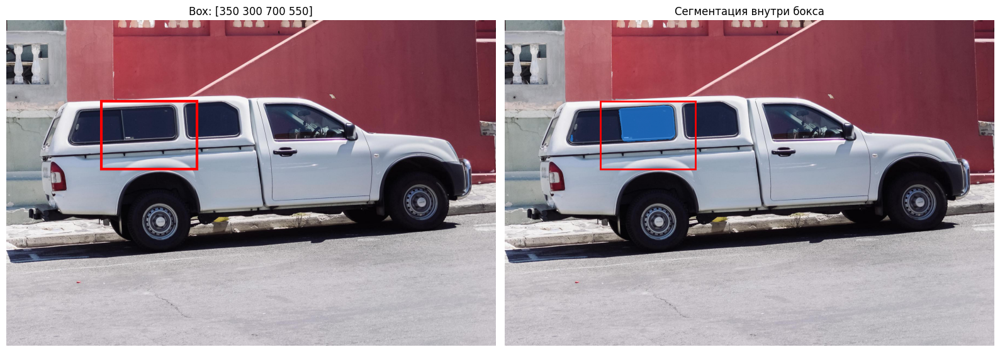

In [21]:
# Задаем bounding box [x1, y1, x2, y2]
input_box = np.array([350, 300, 700, 550])  # Пример: весь грузовик

# Предсказание
masks, scores, logits = predictor.predict(
    box=input_box[None, :],  # Добавляем размерность
    multimask_output=False
)

# Визуализация
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

ax[0].imshow(image)
ax[0].add_patch(plt.Rectangle((input_box[0], input_box[1]),
                               input_box[2]-input_box[0],
                               input_box[3]-input_box[1],
                               fill=False, edgecolor='red', linewidth=3))
ax[0].set_title(f"Box: {input_box}", fontsize=12)
ax[0].axis("off")

ax[1].imshow(image)
show_mask(masks[0], ax[1])
ax[1].add_patch(plt.Rectangle((input_box[0], input_box[1]),
                               input_box[2]-input_box[0],
                               input_box[3]-input_box[1],
                               fill=False, edgecolor='red', linewidth=2))
ax[1].set_title("Сегментация внутри бокса", fontsize=12)
ax[1].axis("off")

plt.tight_layout()
plt.show()

### Задание 3.2: Сегментация нескольких объектов

Попробуйте задать несколько боксов для разных объектов одновременно!

📊 Найдено масок: 2


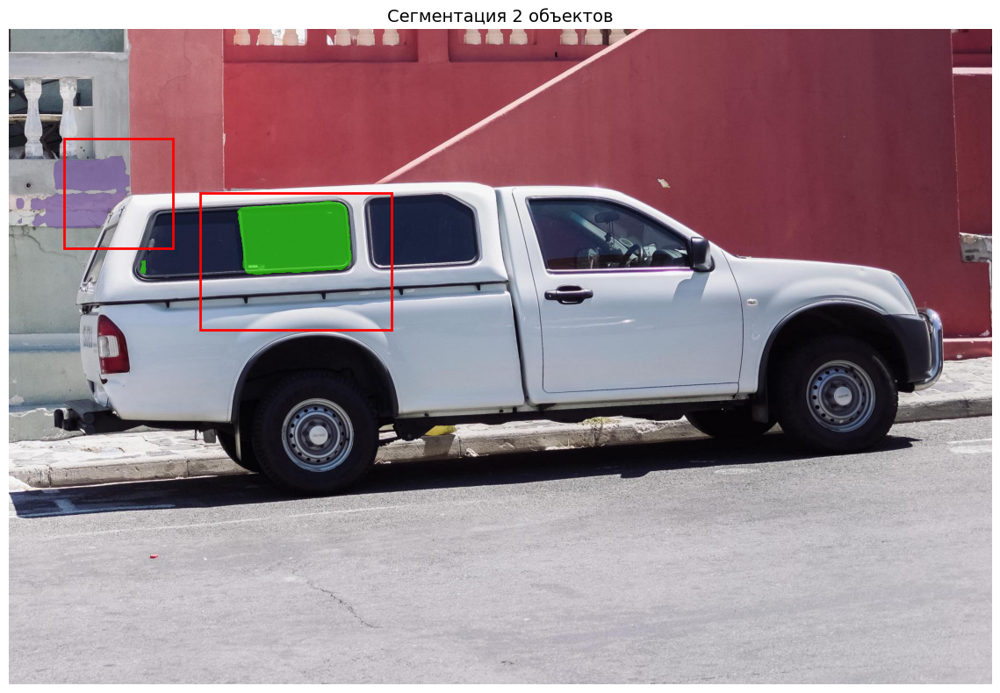

In [22]:
# 📦 Несколько боксов — вызываем predict для каждого отдельно
input_boxes = np.array([
    [350, 300, 700, 550],  # Грузовик
    [100, 200, 300, 400],  # Что-то еще на изображении
], dtype=np.float32)  # Важно: float32!

all_masks = []
all_scores = []

for box in input_boxes:
    masks, scores, logits = predictor.predict(
        box=box[None, :],  # Добавляем измерение батча (1, 4)
        multimask_output=False
    )
    all_masks.append(masks[0])
    all_scores.append(scores[0])

print(f"📊 Найдено масок: {len(all_masks)}")

# Визуализация
plt.figure(figsize=(12, 8))
plt.imshow(image)

for i, (mask, box) in enumerate(zip(all_masks, input_boxes)):
    show_mask(mask, plt.gca(), random_color=True)
    plt.gca().add_patch(plt.Rectangle((box[0], box[1]),
                                       box[2]-box[0], box[3]-box[1],
                                       fill=False, edgecolor='red', linewidth=2))

plt.title(f"Сегментация {len(all_masks)} объектов", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()

## 4. Автоматическая сегментация ВСЕГО (Automatic Mask Generation)

SAM может автоматически найти ВСЕ объекты на изображении без каких-либо промптов!

In [26]:
# Создаем автоматический генератор масок
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=16,  # Сколько точек генерировать на сторону (больше = точнее, но медленнее)
    pred_iou_thresh=0.5,  # Порог качества масок (0-1)
    stability_score_thresh=0.92,  # Порог стабильности
    crop_n_layers=1,  # Сколько слоев кропа использовать
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,  # Минимальная площадь маски
)

print("✅ Генератор создан")

✅ Генератор создан


In [27]:
# Генерируем все маски (это может занять 10-30 секунд)
print("Генерируем маски...")
masks_auto = mask_generator.generate(image)

print(f"Найдено объектов: {len(masks_auto)}")
print(f"Средняя площадь маски: {np.mean([m['area'] for m in masks_auto]):.0f} пикселей")

Генерируем маски...
Найдено объектов: 58
Средняя площадь маски: 45620 пикселей


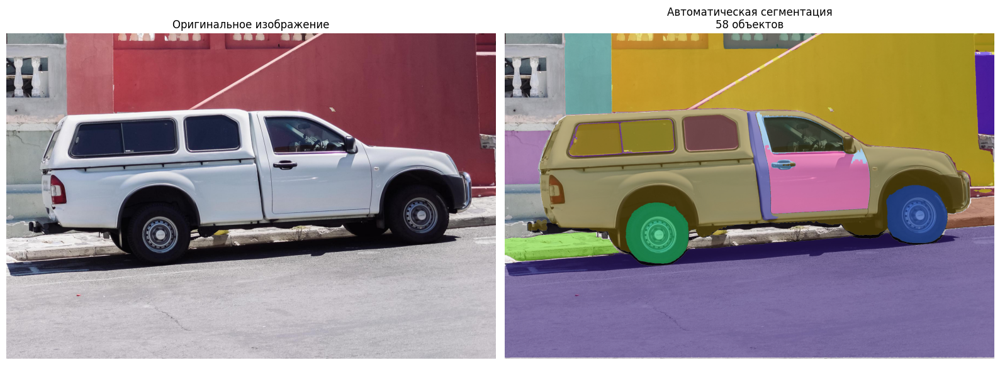

In [28]:
# Визуализация всех масок
def show_anns(anns, ax):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)

    ax.set_autoscale_on(False)
    img = np.ones((sorted_anns[0]['segmentation'].shape[0],
                   sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0

    for ann in sorted_anns[:20]:  # Показываем топ-20 по площади
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask

    ax.imshow(img)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))

ax[0].imshow(image)
ax[0].set_title("Оригинальное изображение", fontsize=12)
ax[0].axis("off")

ax[1].imshow(image)
show_anns(masks_auto, ax[1])
ax[1].set_title(f"Автоматическая сегментация\n{len(masks_auto)} объектов", fontsize=12)
ax[1].axis("off")

plt.tight_layout()
plt.show()

### Задание 4.1: Анализ автоматической сегментации

Попробуйте изменить параметры генератора:
1. `points_per_side=16` (быстрее, но менее точно)
2. `points_per_side=64` (медленнее, но детальнее)
3. `pred_iou_thresh=0.5` (больше масок, но больше шума)
4. `pred_iou_thresh=0.95` (только очень качественные маски)

Сравните количество и качество масок!

## 5. Практическое применение: Интерактивная сегментация

### Задание 5.1: Выделение объекта интереса

Представьте, что вы разрабатываете инструмент для дизайнеров. Пользователь кликает на объект, а SAM его выделяет.

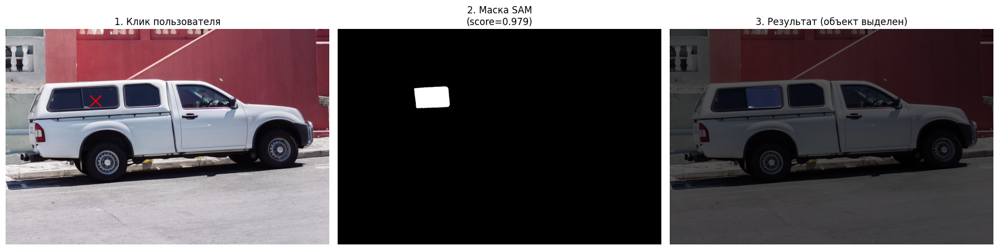

✅ Объект выделен! Площадь: 21535 пикселей


In [29]:
# Сценарий: Пользователь кликает на объект
# Симулируем клик пользователя (задайте координаты)
user_click = np.array([[500, 400]])  # Где кликнул пользователь
user_label = np.array([1])  # 1 = хочу выделить этот объект

# SAM находит объект
masks, scores, logits = predictor.predict(
    point_coords=user_click,
    point_labels=user_label,
    multimask_output=True
)

# Выбираем лучшую маску
best_idx = np.argmax(scores)
best_mask = masks[best_idx]

# Создаем маску для применения фильтров
masked_image = image.copy()
masked_image[~best_mask] = masked_image[~best_mask] // 3  # Затемняем фон

# Визуализация
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

ax[0].imshow(image)
ax[0].scatter(user_click[:, 0], user_click[:, 1], c='red', s=200, marker='x')
ax[0].set_title("1. Клик пользователя", fontsize=12)
ax[0].axis("off")

ax[1].imshow(best_mask, cmap='gray')
ax[1].set_title(f"2. Маска SAM\n(score={scores[best_idx]:.3f})", fontsize=12)
ax[1].axis("off")

ax[2].imshow(masked_image)
ax[2].set_title("3. Результат (объект выделен)", fontsize=12)
ax[2].axis("off")

plt.tight_layout()
plt.show()

print(f"✅ Объект выделен! Площадь: {np.sum(best_mask)} пикселей")

## 6. Сравнение методов

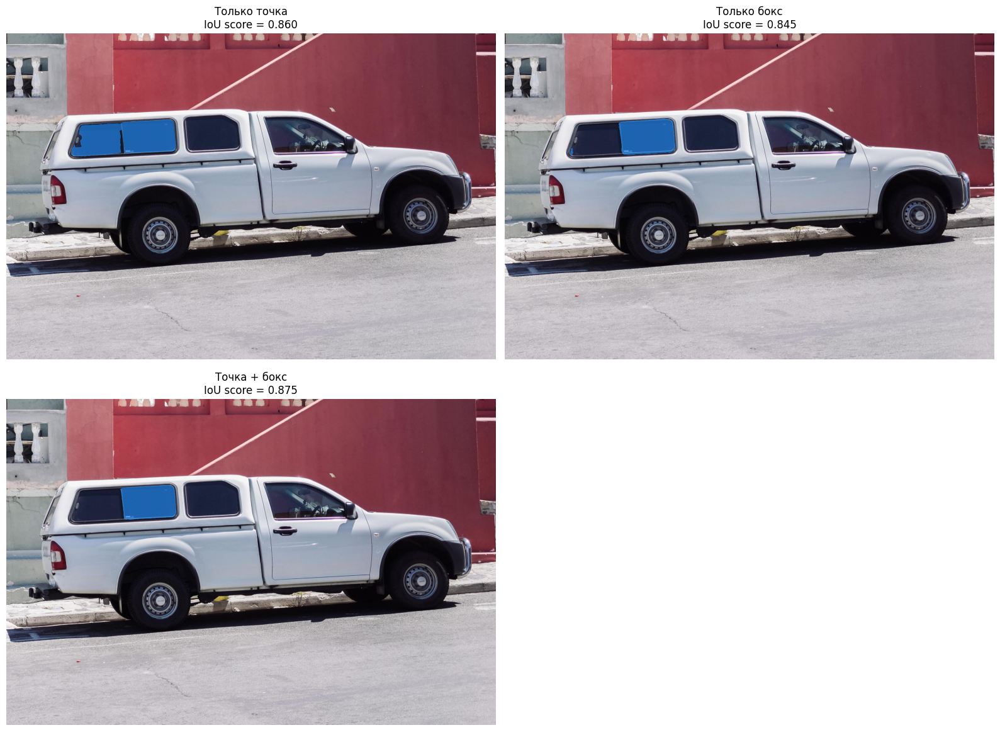

💡 Вывод: Комбинация промптов часто дает лучший результат!


In [30]:
# Сравним три подхода на одном объекте

# 1. Точка
point = np.array([[500, 375]])
masks_point, scores_point, _ = predictor.predict(
    point_coords=point, point_labels=np.array([1]), multimask_output=False
)

# 2. Бокс
box = np.array([350, 300, 700, 550])
masks_box, scores_box, _ = predictor.predict(
    box=box[None, :], multimask_output=False
)

# 3. Точка + бокс вместе!
masks_combined, scores_combined, _ = predictor.predict(
    point_coords=point,
    point_labels=np.array([1]),
    box=box[None, :],
    multimask_output=False
)

# Визуализация сравнения
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

methods = [
    ("Только точка", masks_point[0], scores_point[0]),
    ("Только бокс", masks_box[0], scores_box[0]),
    ("Точка + бокс", masks_combined[0], scores_combined[0]),
]

for idx, (title, mask, score) in enumerate(methods):
    ax = axes[idx // 2, idx % 2]
    ax.imshow(image)
    show_mask(mask, ax)
    ax.set_title(f"{title}\nIoU score = {score:.3f}", fontsize=12)
    ax.axis("off")

# Пустой subplot для красоты
axes[1, 1].axis("off")

plt.tight_layout()
plt.show()

print("💡 Вывод: Комбинация промптов часто дает лучший результат!")

## Домашнее Задание

**Задание 1: Интерактивный инструмент**

Создайте функцию, которая:
1. Принимает изображение и список точек (кликов пользователя)
2. Для каждой точки определяет, к какому объекту она относится
3. Возвращает:
   - Количество уникальных объектов, которые выделил пользователь
   - Общую площадь выделенных объектов
   - Визуализацию с разными цветами для каждого объекта

**Задание 2: Анализ качества**

1. Возьмите 3 разных изображения (природа, город, люди)
2. Для каждого изображения:
   - Запустите автоматическую сегментацию
   - Подсчитайте количество найденных объектов
   - Найдите средний IoU score
   - Сохраните статистику
3. Постройте график: "Тип изображения vs Количество объектов"
4. Сделайте вывод: на каких изображениях SAM работает лучше/хуже?

**Задание 3**

| Трек | Задание |
|------|---------|
| Creative** | Создайте "умное размытие фона": выделите главный объект точкой, размойте все остальное (эффект портретного режима) |
| Analytical | Реализуйте подсчет объектов определенного типа (например, "сколько машин на парковке") используя SAM + простые эвристики |
| Performance | Сравните скорость и качество трех моделей SAM: ViT-B, ViT-L, ViT-H. Постройте график "время vs качество" |


---

### Критерии оценки:
- Код работает без ошибок (20%)
- Правильное использование SAM API (30%)
- Качество визуализаций (20%)
- Глубина анализа и выводов (20%)
- Оформление и комментарии (10%)

### Формат сдачи:
- .ipynb файл с кодом и результатами
- 2-3 абзаца выводов
- Скриншоты результатов

## Полезные советы

### Частые проблемы:
1. CUDA out of memory → Используйте vit_b вместо vit_h, уменьшите `points_per_side`
2. Пустые маски → Проверьте, что точки/боксы внутри изображения
3. Медленная работа → Уменьшите `points_per_side` или используйте CPU для небольших изображений

### Ресурсы:
- [Официальный репозиторий SAM](https://github.com/facebookresearch/segment-anything)
[Demo SAM](https://segment-anything.com/demo) — попробуйте онлайн!
- [Paper SAM](https://arxiv.org/abs/2304.02643) — для тех, кто хочет понять internals
- [SA-1B Dataset](https://segment-anything.com/dataset/index.html) — 1.1 млрд масок!


In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import SamPredictor, sam_model_registry, SamAutomaticMaskGenerator
import time
from collections import defaultdict
from sklearn.cluster import DBSCAN
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['font.size'] = 12

device = "cuda" if torch.cuda.is_available() else "cpu"
sam = sam_model_registry["vit_b"](checkpoint="checkpoints/sam_vit_b_01ec64.pth")
sam.to(device=device)
predictor = SamPredictor(sam)

print(f"Модель загружена на {device}")

Модель загружена на cuda


### Задание 1


ЗАДАНИЕ 1: Интерактивный сегментатор
Симулируем клики пользователя...
Сегментируем объекты...
Найдено объектов: 3


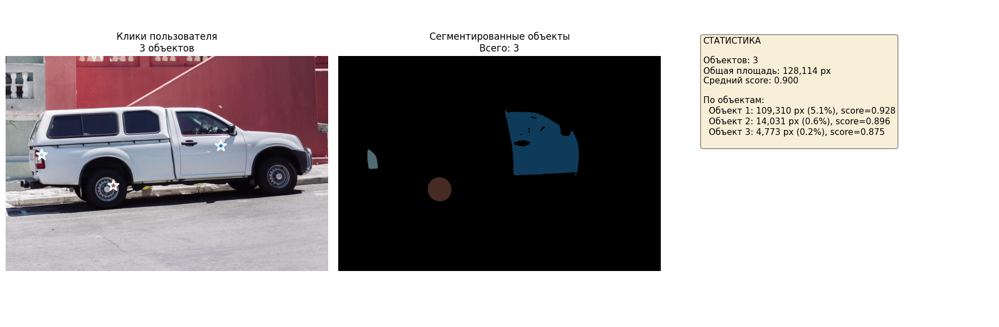

{'num_objects': 3,
 'total_area': np.int64(128114),
 'avg_score': np.float32(0.89969414),
 'objects_details': [{'object_id': 1,
   'area': np.int64(109310),
   'score': np.float32(0.9284726),
   'num_points': 1,
   'area_percentage': np.float64(5.0606481481481485)},
  {'object_id': 2,
   'area': np.int64(14031),
   'score': np.float32(0.8959662),
   'num_points': 1,
   'area_percentage': np.float64(0.6495833333333334)},
  {'object_id': 3,
   'area': np.int64(4773),
   'score': np.float32(0.87464356),
   'num_points': 1,
   'area_percentage': np.float64(0.22097222222222224)}]}

In [7]:
class InteractiveSegmenter:
    def __init__(self, predictor, image):
        self.predictor = predictor
        self.original_image = image.copy()
        self.predictor.set_image(image)
        self.points = []
        self.labels = []
        self.segmented_objects = []

    def add_point(self, x, y, is_foreground=True):
        self.points.append([x, y])
        self.labels.append(1 if is_foreground else 0)
        return len(self.points)

    def clear_points(self):
        self.points = []
        self.labels = []
        self.segmented_objects = []

    def cluster_points_to_objects(self, eps=50):
        """
        Группирует близкие точки в объекты с помощью DBSCAN
        eps - максимальное расстояние между точками одного объекта (в пикселях)
        """
        if len(self.points) == 0:
            return []

        points_array = np.array(self.points)
        labels_array = np.array(self.labels)

        # Используем только позитивные точки для кластеризации
        pos_points = points_array[labels_array == 1]

        if len(pos_points) == 0:
            return []

        # Кластеризация позитивных точек
        clustering = DBSCAN(eps=eps, min_samples=1).fit(pos_points)

        # Группируем точки по объектам
        objects = defaultdict(list)
        for point_idx, cluster_id in enumerate(clustering.labels_):
            objects[cluster_id].append(pos_points[point_idx])

        return list(objects.values())

    def segment_objects(self):
        objects = self.cluster_points_to_objects()
        self.segmented_objects = []

        for obj_points in objects:
            # Берем центроид группы точек как точку промпта
            centroid = np.mean(obj_points, axis=0).reshape(1, -1)

            masks, scores, _ = self.predictor.predict(
                point_coords=centroid,
                point_labels=np.array([1]),
                multimask_output=False
            )

            self.segmented_objects.append({
                'mask': masks[0],
                'score': scores[0],
                'points': obj_points,
                'area': np.sum(masks[0])
            })

        return self.segmented_objects

    def get_statistics(self):
        if not self.segmented_objects:
            return None

        stats = {
            'num_objects': len(self.segmented_objects),
            'total_area': sum(obj['area'] for obj in self.segmented_objects),
            'avg_score': np.mean([obj['score'] for obj in self.segmented_objects]),
            'objects_details': []
        }

        for i, obj in enumerate(self.segmented_objects):
            stats['objects_details'].append({
                'object_id': i + 1,
                'area': obj['area'],
                'score': obj['score'],
                'num_points': len(obj['points']),
                'area_percentage': (obj['area'] / (self.original_image.shape[0] *
                                                    self.original_image.shape[1])) * 100
            })

        return stats

    def visualize(self):
        if not self.segmented_objects:
            # Показываем только точки
            fig, ax = plt.subplots(figsize=(12, 8))
            ax.imshow(self.original_image)

            points_array = np.array(self.points)
            labels_array = np.array(self.labels)

            pos_points = points_array[labels_array == 1]
            neg_points = points_array[labels_array == 0]

            if len(pos_points) > 0:
                ax.scatter(pos_points[:, 0], pos_points[:, 1],
                          c='green', marker='*', s=300, edgecolor='white',
                          label=f'Объект ({len(pos_points)} точек)')
            if len(neg_points) > 0:
                ax.scatter(neg_points[:, 0], neg_points[:, 1],
                          c='red', marker='x', s=200, edgecolor='white',
                          label=f'Фон ({len(neg_points)} точек)')

            ax.legend()
            ax.set_title(f"Клики пользователя: {len(self.points)} точек", fontsize=14)
            ax.axis('off')
            plt.tight_layout()
            plt.show()
            return

        # Визуализируем сегментированные объекты
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        # Оригинал с точками
        axes[0].imshow(self.original_image)
        colors = plt.cm.tab20(np.linspace(0, 1, len(self.segmented_objects)))

        # Отображаем точки по объектам
        for obj_idx, obj in enumerate(self.segmented_objects):
            points = np.array(obj['points'])
            axes[0].scatter(points[:, 0], points[:, 1],
                          c=[colors[obj_idx]], marker='*', s=200,
                          edgecolor='white', linewidth=2)
        axes[0].set_title(f"Клики пользователя\n{len(self.segmented_objects)} объектов", fontsize=12)
        axes[0].axis('off')

        # Все маски вместе
        axes[1].imshow(self.original_image)

        # Исправленная версия создания overlay
        overlay = np.zeros((*self.original_image.shape[:2], 3), dtype=np.float32)
        alpha = 0.5

        for obj_idx, obj in enumerate(self.segmented_objects):
            mask = obj['mask']
            color = colors[obj_idx][:3]
            for c in range(3):
                overlay[mask, c] = overlay[mask, c] * (1 - alpha) + color[c] * alpha

        axes[1].imshow(overlay)
        axes[1].set_title(f"Сегментированные объекты\nВсего: {len(self.segmented_objects)}", fontsize=12)
        axes[1].axis('off')

        # Статистика
        stats = self.get_statistics()
        axes[2].axis('off')
        text = f"СТАТИСТИКА\n\n"
        text += f"Объектов: {stats['num_objects']}\n"
        text += f"Общая площадь: {stats['total_area']:,} px\n"
        text += f"Средний score: {stats['avg_score']:.3f}\n\n"
        text += "По объектам:\n"

        for obj in stats['objects_details']:
            text += f"  Объект {obj['object_id']}: "
            text += f"{obj['area']:,} px "
            text += f"({obj['area_percentage']:.1f}%), "
            text += f"score={obj['score']:.3f}\n"

        axes[2].text(0.1, 0.9, text, transform=axes[2].transAxes,
                    fontsize=11, verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

        plt.tight_layout()
        plt.show()

        return stats

    def visualize_simple(self):
        if not self.segmented_objects:
            print("Нет сегментированных объектов")
            return

        fig, axes = plt.subplots(1, len(self.segmented_objects) + 1,
                                 figsize=(5 * (len(self.segmented_objects) + 1), 5))

        # Исходное изображение с точками
        axes[0].imshow(self.original_image)
        points_array = np.array(self.points)
        labels_array = np.array(self.labels)

        pos_points = points_array[labels_array == 1]
        if len(pos_points) > 0:
            axes[0].scatter(pos_points[:, 0], pos_points[:, 1],
                          c='green', marker='*', s=200, edgecolor='white')

        axes[0].set_title("Исходное изображение\n(зеленые точки - клики)", fontsize=12)
        axes[0].axis('off')

        # Каждый объект отдельно
        for idx, obj in enumerate(self.segmented_objects):
            axes[idx + 1].imshow(self.original_image)

            # Показываем маску
            mask = obj['mask']
            masked_image = self.original_image.copy()
            masked_image[~mask] = masked_image[~mask] // 2
            axes[idx + 1].imshow(masked_image)

            # Показываем точки этого объекта
            points = np.array(obj['points'])
            axes[idx + 1].scatter(points[:, 0], points[:, 1],
                                c='red', marker='*', s=200, edgecolor='white')

            axes[idx + 1].set_title(f"Объект {idx + 1}\n"
                                   f"Score: {obj['score']:.3f}\n"
                                   f"Площадь: {obj['area']} px",
                                   fontsize=12)
            axes[idx + 1].axis('off')

        plt.tight_layout()
        plt.show()

# Теперь запустим исправленную версию
print("\n" + "="*60)
print("ЗАДАНИЕ 1: Интерактивный сегментатор")
print("="*60)

# Загружаем тестовое изображение
test_url = "https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg"
response = requests.get(test_url)
test_image = np.array(Image.open(io.BytesIO(response.content)))

# Создаем интерактивный сегментатор
segmenter = InteractiveSegmenter(predictor, test_image)

# Симулируем клики пользователя
print("Симулируем клики пользователя...")
segmenter.add_point(1200, 500, is_foreground=True)  # Кабина
# segmenter.add_point(1200, 600, is_foreground=True)  # Вторая точка на кабине
segmenter.add_point(600, 720, is_foreground=True)  # Колесо
segmenter.add_point(200, 550, is_foreground=True)  # Фара
segmenter.add_point(620, 200, is_foreground=False)  # Фон

# Сегментируем объекты
print("Сегментируем объекты...")
objects = segmenter.segment_objects()

print(f"Найдено объектов: {len(objects)}")

# Используем упрощенную визуализацию (работает точно)
segmenter.visualize()

# Также показываем полную статистику
# stats = segmenter.get_statistics()
# if stats:
#     print("\nПодробная статистика:")
#     print(f"  • Найдено объектов: {stats['num_objects']}")
#     print(f"  • Общая площадь: {stats['total_area']:,} пикселей")
#     print(f"  • Среднее качество: {stats['avg_score']:.3f}")
#     print("\n Детали по объектам:")
#     for obj in stats['objects_details']:
#         print(f"    Объект {obj['object_id']}: "
#               f"площадь={obj['area']:,}px ({obj['area_percentage']:.1f}%), "
#               f"точек={obj['num_points']}, score={obj['score']:.3f}")

### Задание 2


ЗАДАНИЕ 2: Анализ качества на разных изображениях
  Анализируем: Природа (Природа)...
    Найдено объектов: 33, Время: 12.38с, Средний IoU: 0.937
  Анализируем: Город (Городской)...
    Найдено объектов: 105, Время: 13.93с, Средний IoU: 0.924
  Анализируем: Люди (Люди)...
    Найдено объектов: 61, Время: 12.55с, Средний IoU: 0.938


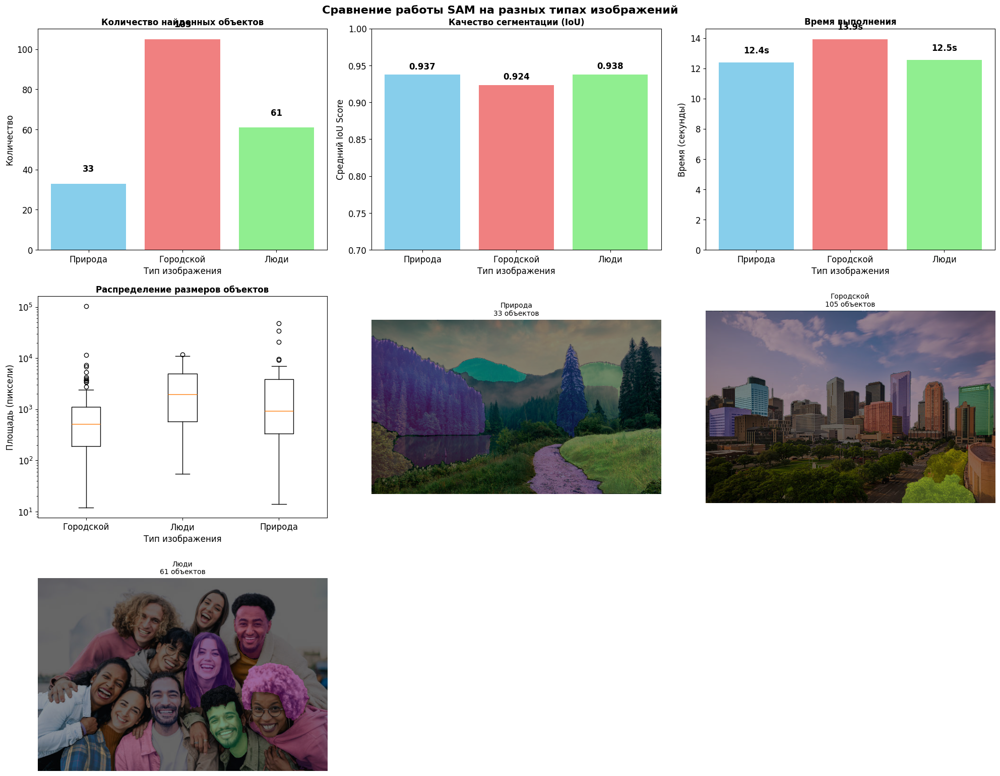

In [12]:
class SAMAnalyzer:
    """
    Класс для анализа качества SAM на разных изображениях
    """
    def __init__(self, sam_model):
        self.sam = sam_model
        self.results = []

    def load_image_from_url(self, url):
        """Загрузить изображение по URL"""
        response = requests.get(url)
        return np.array(Image.open(io.BytesIO(response.content)))

    def analyze_image(self, image, image_name, image_type):
        """
        Анализировать одно изображение
        """
        print(f"  Анализируем: {image_name} ({image_type})...")

        # Создаем генератор масок с разными параметрами
        mask_generator = SamAutomaticMaskGenerator(
            model=self.sam,
            points_per_side=32,
            pred_iou_thresh=0.88,
            stability_score_thresh=0.95,
            crop_n_layers=1,
            crop_n_points_downscale_factor=2,
            min_mask_region_area=100,
        )

        start_time = time.time()
        masks = mask_generator.generate(image)
        end_time = time.time()

        # Анализируем результаты
        result = {
            'image_name': image_name,
            'image_type': image_type,
            'num_objects': len(masks),
            'time_seconds': end_time - start_time,
            'avg_iou_score': np.mean([m['predicted_iou'] for m in masks]) if masks else 0,
            'avg_stability_score': np.mean([m['stability_score'] for m in masks]) if masks else 0,
            'total_area': np.mean([m['area'] for m in masks]) if masks else 0,
            'mask_sizes': [m['area'] for m in masks],
            'masks': masks,
            'image': image
        }

        self.results.append(result)
        print(f"    Найдено объектов: {result['num_objects']}, "
              f"Время: {result['time_seconds']:.2f}с, "
              f"Средний IoU: {result['avg_iou_score']:.3f}")

        return result

    def visualize_results(self):
      if not self.results:
          print("Нет данных для визуализации")
          return

      # Определяем количество изображений для отображения (максимум 3)
      num_images = min(len(self.results), 3)

      # Создаем сетку: 2 строки, 3 колонки для графиков,
      # плюс дополнительная строка для изображений если нужно
      if num_images <= 2:
          fig = plt.figure(figsize=(20, 12))
          rows, cols = 2, 3
      else:
          fig = plt.figure(figsize=(20, 16))
          rows, cols = 3, 3  # 3x3 сетка для 3 изображений

      # 1. Сравнение количества объектов (1,1)
      ax1 = plt.subplot(rows, cols, 1)
      types = [r['image_type'] for r in self.results]
      counts = [r['num_objects'] for r in self.results]
      bars = ax1.bar(types, counts, color=['skyblue', 'lightcoral', 'lightgreen'])
      ax1.set_title('Количество найденных объектов', fontsize=12, fontweight='bold')
      ax1.set_ylabel('Количество')
      ax1.set_xlabel('Тип изображения')
      for bar, count in zip(bars, counts):
          ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
                  f'{count}', ha='center', va='bottom', fontweight='bold')

      # 2. Сравнение качества (IoU) (1,2)
      ax2 = plt.subplot(rows, cols, 2)
      iou_scores = [r['avg_iou_score'] for r in self.results]
      bars = ax2.bar(types, iou_scores, color=['skyblue', 'lightcoral', 'lightgreen'])
      ax2.set_title('Качество сегментации (IoU)', fontsize=12, fontweight='bold')
      ax2.set_ylabel('Средний IoU Score')
      ax2.set_xlabel('Тип изображения')
      ax2.set_ylim(0.7, 1.0)
      for bar, score in zip(bars, iou_scores):
          ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                  f'{score:.3f}', ha='center', va='bottom', fontweight='bold')

      # 3. Время выполнения (1,3)
      ax3 = plt.subplot(rows, cols, 3)
      times = [r['time_seconds'] for r in self.results]
      bars = ax3.bar(types, times, color=['skyblue', 'lightcoral', 'lightgreen'])
      ax3.set_title('Время выполнения', fontsize=12, fontweight='bold')
      ax3.set_ylabel('Время (секунды)')
      ax3.set_xlabel('Тип изображения')
      for bar, t in zip(bars, times):
          ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                  f'{t:.1f}s', ha='center', va='bottom', fontweight='bold')

      # 4. Распределение размеров масок (2,1)
      ax4 = plt.subplot(rows, cols, 4)
      all_sizes = []
      labels = []
      for r in self.results:
          all_sizes.extend(r['mask_sizes'])
          labels.extend([r['image_type']] * len(r['mask_sizes']))

      # Создаем boxplot
      data_by_type = []
      type_labels = []
      for img_type in sorted(set(labels)):
          sizes = [s for s, t in zip(all_sizes, labels) if t == img_type]
          data_by_type.append(sizes)
          type_labels.append(img_type)

      ax4.boxplot(data_by_type, labels=type_labels)
      ax4.set_title('Распределение размеров объектов', fontsize=12, fontweight='bold')
      ax4.set_ylabel('Площадь (пиксели)')
      ax4.set_xlabel('Тип изображения')
      ax4.set_yscale('log')

      # 5-7. Примеры масок для каждого типа
      for idx in range(num_images):
          result = self.results[idx]
          ax = plt.subplot(rows, cols, 5 + idx)  # Позиции 5, 6, 7

          img = result['image']
          ax.imshow(img)

          # Показываем топ-10 масок
          sorted_masks = sorted(result['masks'], key=lambda x: x['area'], reverse=True)[:10]

          # Создаем полупрозрачное наложение
          overlay = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.float32)

          for mask_data in sorted_masks:
              mask = mask_data['segmentation']
              # Убеждаемся, что маска правильной размерности
              if mask.shape != (img.shape[0], img.shape[1]):
                  continue
              color = np.random.random(3)
              alpha = 0.4

              # Накладываем цвет
              for c in range(3):
                  overlay[mask, c] = overlay[mask, c] * (1 - alpha) + color[c] * alpha

          ax.imshow(overlay, alpha=0.6)
          ax.set_title(f"{result['image_type']}\n{result['num_objects']} объектов", fontsize=10)
          ax.axis('off')

      plt.suptitle('Сравнение работы SAM на разных типах изображений', fontsize=16, fontweight='bold')
      plt.tight_layout()
      plt.show()

print("\n" + "="*60)
print("ЗАДАНИЕ 2: Анализ качества на разных изображениях")
print("="*60)

analyzer = SAMAnalyzer(sam)

test_images = [
    {
        'url': "https://t4.ftcdn.net/jpg/02/91/24/27/360_F_291242770_z3XC7rJB1Mvc5jVMsEY9Dx2xMrX4sxUi.jpg",
        'name': "Природа",
        'type': "Природа"
    },
    {
        'url': "https://media.istockphoto.com/id/542727462/photo/houston-texas-skyline.jpg?s=612x612&w=0&k=20&c=ldhxhUFIIaST-o064dsyyzMSV76Eqt0fpjMJUWTP0Is=",
        'name': "Город",
        'type': "Городской"
    },
    {
        'url': "https://media.istockphoto.com/id/1368965646/photo/multi-ethnic-guys-and-girls-taking-selfie-outdoors-with-backlight-happy-life-style-friendship.jpg?s=612x612&w=0&k=20&c=qYST1TAGoQGV_QnB_vMd4E8jdaQUUo95Sa2JaKSl_-4=",
        'name': "Люди",
        'type': "Люди"
    }
]

for img_info in test_images:
    try:
        image = analyzer.load_image_from_url(img_info['url'])
        # Изменяем размер для ускорения
        if image.shape[0] > 800:
            scale = 800 / image.shape[0]
            new_size = (int(image.shape[1] * scale), 800)
            image = cv2.resize(image, new_size)

        analyzer.analyze_image(image, img_info['name'], img_info['type'])
    except Exception as e:
        print(f"Ошибка загрузки {img_info['name']}: {e}")

analyzer.visualize_results()

**Выводы:**
- SAM находит больше всего объектов на городской фотографии. Это можно сравнить с картинкой природы - сегментировать отдельные здания получается намного проще, чем отдельные деревья, которые группируются в один объект.
- IoU для всех типов изображений >0.9, т.е. SAM подходит для разных типов изображений.



### Задание 3

#### Creative


ЗАДАНИЕ 3: Creative Track - Умное размытие фона


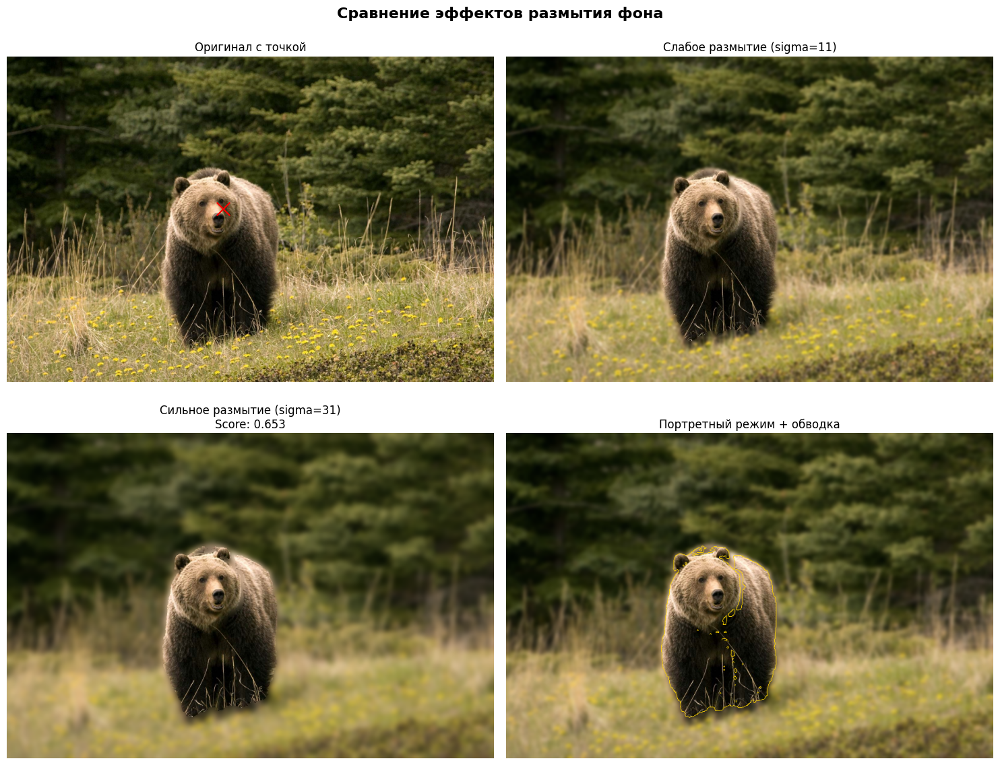


Результат сохранен как 'portrait_effect_result.jpg'


In [33]:
class SmartBackgroundBlur:
    def __init__(self, predictor):
        self.predictor = predictor

    def blur_background(self, image, main_object_point, blur_strength=21):
        self.predictor.set_image(image)

        # Сегментируем главный объект
        masks, scores, _ = self.predictor.predict(
            point_coords=np.array([main_object_point]),
            point_labels=np.array([1]),
            multimask_output=False
        )

        mask = masks[0]

        # Создаем размытую версию изображения
        blurred = cv2.GaussianBlur(image, (blur_strength, blur_strength), 0)

        # Комбинируем: объект из оригинала, фон из размытого
        result = image.copy()
        result[~mask] = blurred[~mask]

        return result, mask, scores[0]

    def portrait_mode_with_edges(self, image, main_object_point, blur_strength=21):
        """
        Продвинутая версия с подсветкой краев
        """
        result, mask, score = self.blur_background(image, main_object_point, blur_strength)

        # Находим края объекта
        edges = cv2.Canny(mask.astype(np.uint8) * 255, 50, 150)
        edges = edges > 0

        # Добавляем обводку
        result[edges] = [255, 215, 0]  # Золотой цвет

        return result, mask, score

    def compare_modes(self, image, main_object_point):
        """Сравнить разные режимы размытия"""
        fig, axes = plt.subplots(2, 2, figsize=(15, 12))

        # Оригинал
        axes[0, 0].imshow(image)
        axes[0, 0].scatter(main_object_point[0], main_object_point[1],
                          c='red', s=200, marker='x')
        axes[0, 0].set_title("Оригинал с точкой", fontsize=12)
        axes[0, 0].axis('off')

        # Слабое размытие
        result_light, _, _ = self.blur_background(image, main_object_point, 11)
        axes[0, 1].imshow(result_light)
        axes[0, 1].set_title("Слабое размытие (sigma=11)", fontsize=12)
        axes[0, 1].axis('off')

        # Сильное размытие
        result_strong, mask, score = self.blur_background(image, main_object_point, 31)
        axes[1, 0].imshow(result_strong)
        axes[1, 0].set_title(f"Сильное размытие (sigma=31)\nScore: {score:.3f}", fontsize=12)
        axes[1, 0].axis('off')

        # Портретный режим с обводкой
        result_portrait, _, _ = self.portrait_mode_with_edges(image, main_object_point, 21)
        axes[1, 1].imshow(result_portrait)
        axes[1, 1].set_title("Портретный режим + обводка", fontsize=12)
        axes[1, 1].axis('off')

        plt.suptitle("Сравнение эффектов размытия фона", fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()

        return result_portrait

print("\n" + "="*60)
print("ЗАДАНИЕ 3: Creative Track - Умное размытие фона")
print("="*60)

# portrait_url = "https://images.unsplash.com/photo-1534528741775-53994a69daeb?w=800"  # Портрет
portrait_url = "https://cdn.britannica.com/41/156441-050-A4424AEC/Grizzly-bear-Jasper-National-Park-Canada-Alberta.jpg"
response = requests.get(portrait_url)
portrait_image = np.array(Image.open(io.BytesIO(response.content)))

# Изменяем размер для ускорения
if portrait_image.shape[0] > 600:
    scale = 600 / portrait_image.shape[0]
    new_size = (int(portrait_image.shape[1] * scale), 600)
    portrait_image = cv2.resize(portrait_image, new_size)


blur_effect = SmartBackgroundBlur(predictor)

# Точка
# face_point = [portrait_image.shape[1] // 2, portrait_image.shape[0] // 3]
face_point = [portrait_image.shape[1] // 2-50, portrait_image.shape[0] // 2-20]

result = blur_effect.compare_modes(portrait_image, face_point)

plt.imsave('portrait_effect_result.jpg', result)
print("\nРезультат сохранен как 'portrait_effect_result.jpg'")

#### Analytical


МЕТОД 1: Геометрические эвристики
Генерация масок...
Найдено кандидатов: 95
Обнаружено автомобилей: 12
Других объектов: 83
Средний score: 0.64


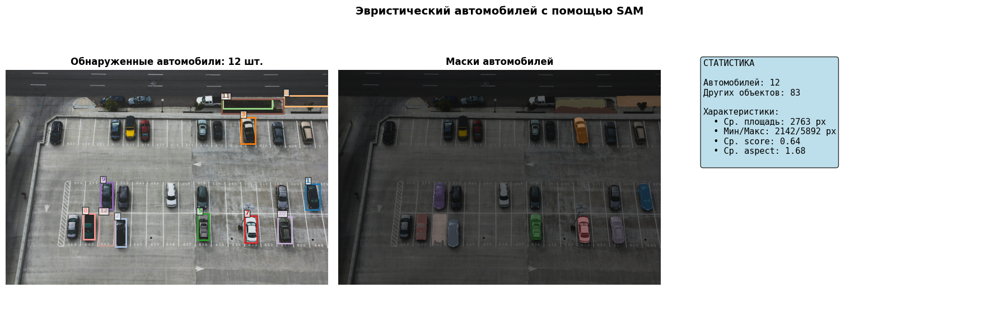


МЕТОД 2: Цветовой анализ
Найдено масок: 73
Автомобилей: 15
Растительности: 1


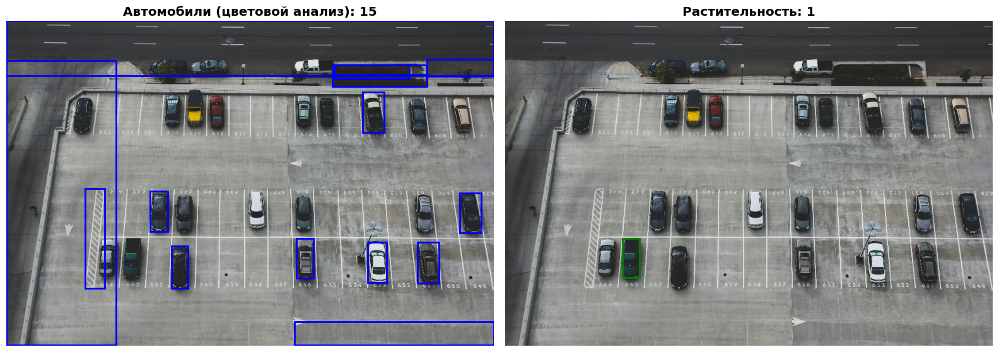


МЕТОД 3: детектор с NMS
Генерация масок...
Найдено кандидатов: 95
Обнаружено автомобилей: 12
Других объектов: 83
Средний score: 0.64
Применяем NMS (IoU threshold=0.4)...
  До NMS: 12, После NMS: 11


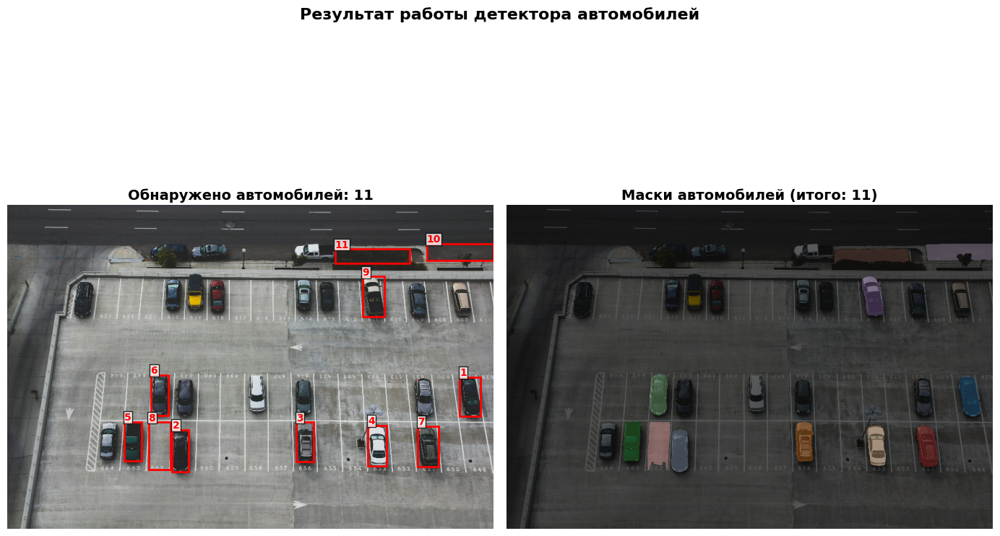


Финальный результат: 11 автомобилей обнаружено


In [29]:
class RealisticObjectCounter:
    def __init__(self, predictor):
        self.predictor = predictor

    def detect_vehicles_on_parking(self, image):
        # Генерируем все возможные маски
        mask_generator = SamAutomaticMaskGenerator(
            model=self.predictor.model,
            points_per_side=32,
            pred_iou_thresh=0.85,
            stability_score_thresh=0.9,
            min_mask_region_area=2000,
        )

        print("Генерация масок...")
        masks = mask_generator.generate(image)
        print(f"Найдено кандидатов: {len(masks)}")

        # Анализируем каждую маску
        vehicles = []
        other_objects = []

        for i, mask_data in enumerate(masks):
            mask = mask_data['segmentation']
            area = mask_data['area']

            # Пропускаем слишком маленькие объекты
            if area < 2000:
                other_objects.append({'type': 'other', 'area': area, 'reason': 'too small'})
                continue

            # Получаем bounding box
            y_coords, x_coords = np.where(mask)
            if len(y_coords) == 0:
                continue

            x_min, x_max = x_coords.min(), x_coords.max()
            y_min, y_max = y_coords.min(), y_coords.max()

            width = x_max - x_min
            height = y_max - y_min

            # Ключевые признаки автомобиля
            aspect_ratio = height / width if width > 0 else 0
            coverage = area / (width * height) if width * height > 0 else 0
            vehicle_score = 0

            # 1. Соотношение сторон
            if 1.2 <= aspect_ratio <= 2.8:
                vehicle_score += 0.4
            elif 1.0 <= aspect_ratio <= 3.0:
                vehicle_score += 0.2
            elif aspect_ratio > 3.0:
                vehicle_score -= 0.2  # Слишком широко - возможно не автомобиль

            # 2. Покрытие bounding box
            if coverage > 0.5:
                vehicle_score += 0.3
            elif coverage > 0.3:
                vehicle_score += 0.1
            elif coverage < 0.2:
                vehicle_score -= 0.2

            # 3. Компактность формы
            from scipy import ndimage
            struct = ndimage.generate_binary_structure(2, 2)
            erode = ndimage.binary_erosion(mask, struct)
            perimeter = np.sum(np.logical_xor(mask, erode))
            compactness = (perimeter * perimeter) / area if area > 0 else 0

            if compactness < 50:  # Компактные - автомобили
                vehicle_score += 0.2
            elif compactness > 100:  # Изрезанные - деревья
                vehicle_score -= 0.2

            # 4. Позиция на изображении
            image_height = image.shape[0]
            y_center = (y_min + y_max) / 2
            if y_center > image_height * 0.4:
                vehicle_score += 0.1

            # 5. Проверка на "вертикальность"
            if height > width * 1.5:  # Выше чем ширина - не автомобиль
                vehicle_score -= 0.3

            # Классификация
            if vehicle_score >= 0.5:
                vehicles.append({
                    'mask': mask_data,
                    'score': vehicle_score,
                    'bbox': (x_min, y_min, x_max, y_max),
                    'area': area,
                    'aspect_ratio': aspect_ratio,
                    'coverage': coverage
                })
            else:
                other_objects.append({
                    'type': 'other',
                    'area': area,
                    'score': vehicle_score,
                    'reason': f'vehicle_score={vehicle_score:.2f}'
                })

        print(f"Обнаружено автомобилей: {len(vehicles)}")
        print(f"Других объектов: {len(other_objects)}")

        if len(vehicles) > 0:
            print(f"Средний score: {np.mean([v['score'] for v in vehicles]):.2f}")

        return vehicles, other_objects

    def visualize_vehicles(self, image, vehicles, other_objects):
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        # 1. Оригинал с выделенными автомобилями
        ax1 = axes[0]
        ax1.imshow(image)

        for i, vehicle in enumerate(vehicles):
            x_min, y_min, x_max, y_max = vehicle['bbox']
            color = plt.cm.tab20(i % 20)
            rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                fill=False, edgecolor=color, linewidth=2)
            ax1.add_patch(rect)
            ax1.text(x_min, y_min - 3, f'{i+1}', fontsize=8, color=color,
                    weight='bold', bbox=dict(facecolor='white', alpha=0.7, pad=1))

        ax1.set_title(f"Обнаруженные автомобили: {len(vehicles)} шт.", fontsize=12, fontweight='bold')
        ax1.axis('off')

        # 2. Маски автомобилей
        ax2 = axes[1]
        ax2.imshow(image)

        overlay = np.zeros((image.shape[0], image.shape[1], 3), dtype=np.float32)
        for idx, vehicle in enumerate(vehicles):
            mask = vehicle['mask']['segmentation']
            color = plt.cm.tab20(idx % 20)[:3]
            alpha = 0.4
            for c in range(3):
                overlay[mask, c] = overlay[mask, c] * (1 - alpha) + color[c] * alpha

        ax2.imshow(overlay, alpha=0.6)
        ax2.set_title(f"Маски автомобилей", fontsize=12, fontweight='bold')
        ax2.axis('off')

        # 3. Статистика
        ax3 = axes[2]
        ax3.axis('off')

        text = "СТАТИСТИКА\n\n"
        text += f"Автомобилей: {len(vehicles)}\n"
        text += f"Других объектов: {len(other_objects)}\n\n"

        if vehicles:
            text += "Характеристики:\n"
            areas = [v['area'] for v in vehicles]
            text += f"  • Ср. площадь: {np.mean(areas):.0f} px\n"
            text += f"  • Мин/Макс: {np.min(areas):.0f}/{np.max(areas):.0f} px\n"
            text += f"  • Ср. score: {np.mean([v['score'] for v in vehicles]):.2f}\n"
            text += f"  • Ср. aspect: {np.mean([v['aspect_ratio'] for v in vehicles]):.2f}\n"

        ax3.text(0.1, 0.9, text, transform=ax3.transAxes, fontsize=11,
                verticalalignment='top', fontfamily='monospace',
                bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

        plt.suptitle("Эвристический автомобилей с помощью SAM",
                    fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()

    def count_with_color_analysis(self, image):

        # Конвертируем в HSV
        hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

        # Генерируем маски
        mask_generator = SamAutomaticMaskGenerator(
            model=self.predictor.model,
            points_per_side=32,
            pred_iou_thresh=0.85,
            min_mask_region_area=2000
        )

        masks = mask_generator.generate(image)
        print(f"Найдено масок: {len(masks)}")

        vehicles = []
        vegetation = []

        for mask_data in masks:
            mask = mask_data['segmentation']
            area = mask_data['area']

            if area < 2000 or area > 100000:
                continue

            # Анализируем цвета внутри маски
            masked_hsv = hsv[mask]

            if len(masked_hsv) == 0:
                continue

            # Средний оттенок (Hue)
            mean_hue = np.mean(masked_hsv[:, 0])
            mean_saturation = np.mean(masked_hsv[:, 1])

            # Классификация на основе цвета
            # Зеленый диапазон в HSV OpenCV: 35-85
            if 35 <= mean_hue <= 85 and mean_saturation > 50:
                vegetation.append({'area': area, 'hue': mean_hue, 'mask': mask_data})
            else:
                vehicles.append({
                    'mask': mask_data,
                    'hue': mean_hue,
                    'saturation': mean_saturation,
                    'area': area
                })

        print(f"Автомобилей: {len(vehicles)}")
        print(f"Растительности: {len(vegetation)}")

        # Визуализация
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))

        axes[0].imshow(image)
        for v in vehicles:
            mask = v['mask']['segmentation']
            y_coords, x_coords = np.where(mask)
            if len(y_coords) > 0:
                x_min, x_max = x_coords.min(), x_coords.max()
                y_min, y_max = y_coords.min(), y_coords.max()
                rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                    fill=False, edgecolor='blue', linewidth=2)
                axes[0].add_patch(rect)
        axes[0].set_title(f"Автомобили (цветовой анализ): {len(vehicles)}", fontweight='bold')
        axes[0].axis('off')

        axes[1].imshow(image)
        for v in vegetation:
            mask = v['mask']['segmentation']
            y_coords, x_coords = np.where(mask)
            if len(y_coords) > 0:
                x_min, x_max = x_coords.min(), x_coords.max()
                y_min, y_max = y_coords.min(), y_coords.max()
                rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                    fill=False, edgecolor='green', linewidth=2)
                axes[1].add_patch(rect)
        axes[1].set_title(f"Растительность: {len(vegetation)}", fontweight='bold')
        axes[1].axis('off')

        plt.tight_layout()
        plt.show()

        return vehicles, vegetation


class EnhancedVehicleDetector:
    """Детектор автомобилей с NMS"""
    def __init__(self, predictor):
        self.predictor = predictor

    def calculate_iou(self, box1, box2):
        x1 = max(box1[0], box2[0])
        y1 = max(box1[1], box2[1])
        x2 = min(box1[2], box2[2])
        y2 = min(box1[3], box2[3])

        intersection = max(0, x2 - x1) * max(0, y2 - y1)
        area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
        area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
        union = area1 + area2 - intersection

        return intersection / union if union > 0 else 0

    def apply_nms(self, detections, iou_threshold=0.4):
        if len(detections) == 0:
            return []

        # Сортируем по score
        detections = sorted(detections, key=lambda x: x['score'], reverse=True)

        keep = []
        boxes = [d['bbox'] for d in detections]

        for i in range(len(detections)):
            keep_current = True
            for j in keep:
                iou = self.calculate_iou(boxes[i], boxes[j])
                if iou > iou_threshold:
                    keep_current = False
                    break
            if keep_current:
                keep.append(i)

        return [detections[i] for i in keep]

    def detect_vehicles(self, image):

        # Используем предыдущий метод для детекции
        counter = RealisticObjectCounter(self.predictor)
        vehicles, _ = counter.detect_vehicles_on_parking(image)

        if len(vehicles) == 0:
            print("Автомобили не обнаружены")
            return []

        # Конвертируем в формат для NMS
        detections = []
        for v in vehicles:
            detections.append({
                'bbox': v['bbox'],
                'score': v['score'],
                'mask': v['mask'],
                'area': v['area']
            })

        # Применяем NMS
        print(f"Применяем NMS (IoU threshold=0.4)...")
        final_detections = self.apply_nms(detections, iou_threshold=0.4)
        print(f"  До NMS: {len(detections)}, После NMS: {len(final_detections)}")

        return final_detections


parking_url = "https://images.unsplash.com/photo-1506521781263-d8422e82f27a?fm=jpg&q=60&w=3000&auto=format&fit=crop&ixlib=rb-4.1.0&ixid=M3wxMjA3fDB8MHxzZWFyY2h8Mnx8cGFya2luZyUyMGxvdHxlbnwwfHwwfHx8MA%3D%3D"
response = requests.get(parking_url)
parking_image = np.array(Image.open(io.BytesIO(response.content)))

# Изменяем размер
scale = 600 / parking_image.shape[0]
new_size = (int(parking_image.shape[1] * scale), 600)
parking_image = cv2.resize(parking_image, new_size)

realistic_counter = RealisticObjectCounter(predictor)

print("\nМЕТОД 1: Геометрические эвристики")
vehicles, other = realistic_counter.detect_vehicles_on_parking(parking_image)
realistic_counter.visualize_vehicles(parking_image, vehicles, other)

print("\nМЕТОД 2: Цветовой анализ")
vehicles_color, vegetation = realistic_counter.count_with_color_analysis(parking_image)

print("\nМЕТОД 3: детектор с NMS")
enhanced_detector = EnhancedVehicleDetector(predictor)
final_vehicles = enhanced_detector.detect_vehicles(parking_image)

# Финальная визуализация
if final_vehicles:
    plt.figure(figsize=(14, 10))

    # Оригинал с bounding boxes
    plt.subplot(1, 2, 1)
    plt.imshow(parking_image)

    for i, vehicle in enumerate(final_vehicles):
        x_min, y_min, x_max, y_max = vehicle['bbox']
        rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                            fill=False, edgecolor='red', linewidth=2)
        plt.gca().add_patch(rect)
        plt.text(x_min, y_min - 3, f'{i+1}', fontsize=10, color='red',
                weight='bold', bbox=dict(facecolor='white', alpha=0.8, pad=1))

    plt.title(f"Обнаружено автомобилей: {len(final_vehicles)}", fontsize=14, fontweight='bold')
    plt.axis('off')

    # Маски автомобилей
    plt.subplot(1, 2, 2)
    overlay = np.zeros((parking_image.shape[0], parking_image.shape[1], 3), dtype=np.float32)

    for idx, vehicle in enumerate(final_vehicles):
        mask = vehicle['mask']['segmentation']
        color = plt.cm.tab20(idx % 20)[:3]
        alpha = 0.5
        for c in range(3):
            overlay[mask, c] = overlay[mask, c] * (1 - alpha) + color[c] * alpha

    plt.imshow(parking_image)
    plt.imshow(overlay, alpha=0.6)
    plt.title(f"Маски автомобилей (итого: {len(final_vehicles)})", fontsize=14, fontweight='bold')
    plt.axis('off')

    plt.suptitle("Результат работы детектора автомобилей", fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

    print(f"\nФинальный результат: {len(final_vehicles)} автомобилей обнаружено")
else:
    print("\nАвтомобили не обнаружены. Попробуйте другое изображение.")

#### Performance


ЗАДАНИЕ 3 - PERFORMANCE TRACK: Сравнение моделей SAM

Тестируем ViT-B...

Тестируем ViT-L...

Тестируем ViT-H...


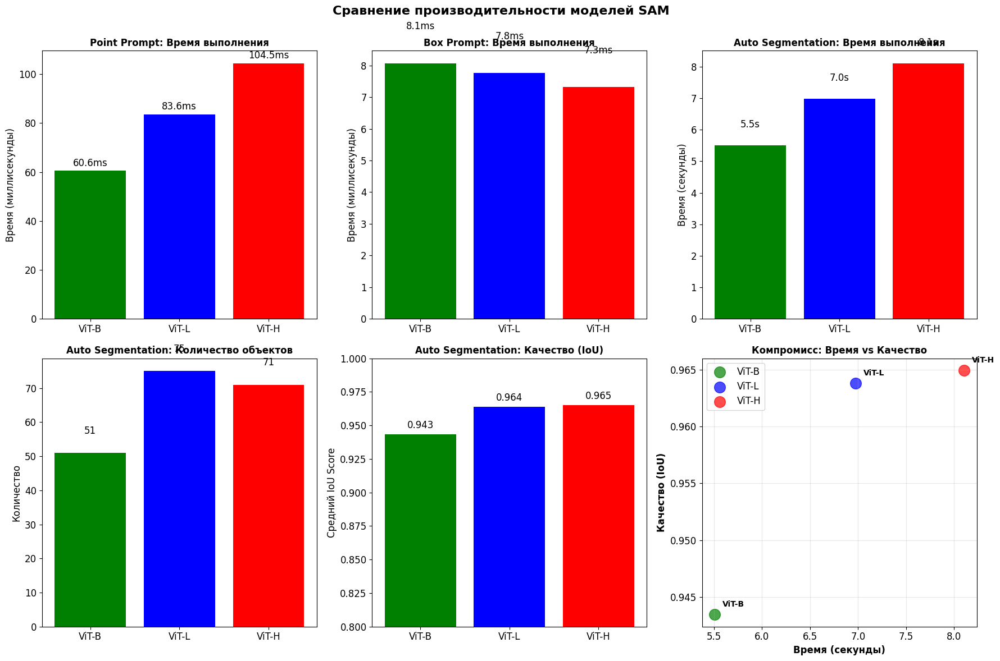


СВОДНАЯ ТАБЛИЦА:
----------------------------------------------------------------------
Модель     Point (мс)   Box (мс)     Auto (с)     Объектов   IoU     
----------------------------------------------------------------------
ViT-B      60.6         8.1          5.51         51         0.943   
ViT-L      83.6         7.8          6.97         75         0.964   
ViT-H      104.5        7.3          8.11         71         0.965   


In [23]:
class SAMPerformanceTester:
    def __init__(self):
        self.models = {
            'ViT-B': {
                'checkpoint': 'sam_vit_b_01ec64.pth',
                'model_type': 'vit_b',
                'color': 'green',
                'size_mb': 358
            },
            'ViT-L': {
                'checkpoint': 'sam_vit_l_0b3195.pth',
                'model_type': 'vit_l',
                'color': 'blue',
                'size_mb': 1218
            },
            'ViT-H': {
                'checkpoint': 'sam_vit_h_4b8939.pth',
                'model_type': 'vit_h',
                'color': 'red',
                'size_mb': 2456
            }
        }
        self.results = {}

    def download_model_if_needed(self, model_name, checkpoint_path):
        if not Path(checkpoint_path).exists():
            try:
                hf_hub_download("ybelkada/segment-anything", checkpoint_path, local_dir="")
            except Exception as e:
                print(f"Ошибка: {e}")
                return False
        return True

    def load_model(self, model_name):
        model_info = self.models[model_name]
        checkpoint_path = f"checkpoints/{model_info['checkpoint']}"

        if not self.download_model_if_needed(model_name, checkpoint_path):
            return None

        sam = sam_model_registry[model_info['model_type']](checkpoint=checkpoint_path)
        sam.to(device=device)
        return sam

    def test_point_prompt(self, predictor, image, point, label):
        start_time = time.time()
        masks, scores, logits = predictor.predict(
            point_coords=point,
            point_labels=label,
            multimask_output=False
        )
        end_time = time.time()

        return {
            'time_ms': (end_time - start_time) * 1000,
            'mask_area': np.sum(masks[0]),
            'score': scores[0]
        }

    def test_box_prompt(self, predictor, image, box):
        start_time = time.time()
        masks, scores, logits = predictor.predict(
            box=box,
            multimask_output=False
        )
        end_time = time.time()

        return {
            'time_ms': (end_time - start_time) * 1000,
            'mask_area': np.sum(masks[0]),
            'score': scores[0]
        }

    def test_automatic_segmentation(self, sam, image, points_per_side=32):
        mask_generator = SamAutomaticMaskGenerator(
            model=sam,
            points_per_side=points_per_side,
            pred_iou_thresh=0.88,
            stability_score_thresh=0.95,
        )

        start_time = time.time()
        masks = mask_generator.generate(image)
        end_time = time.time()

        return {
            'time_s': end_time - start_time,
            'num_masks': len(masks),
            'avg_iou': np.mean([m['predicted_iou'] for m in masks]) if masks else 0,
            'avg_stability': np.mean([m['stability_score'] for m in masks]) if masks else 0,
            'total_masks_area': np.sum([m['area'] for m in masks]) if masks else 0
        }

    def run_performance_test(self, test_image, test_point, test_box):
        for model_name in self.models.keys():
            print(f"\nТестируем {model_name}...")
            sam = self.load_model(model_name)
            if sam is None:
                continue

            predictor = SamPredictor(sam)
            predictor.set_image(test_image)

            results = {}

            # Тест 1: Point prompt
            point_results = self.test_point_prompt(predictor, test_image, test_point, np.array([1]))
            results['point_prompt'] = point_results

            # Тест 2: Box prompt
            box_results = self.test_box_prompt(predictor, test_image, test_box)
            results['box_prompt'] = box_results

            # Тест 3: Automatic segmentation
            auto_results = self.test_automatic_segmentation(sam, test_image)
            results['automatic'] = auto_results

            # Очищаем память
            del sam
            if device == "cuda":
                torch.cuda.empty_cache()

            self.results[model_name] = results

        return self.results

    def plot_performance_comparison(self):
        fig = plt.figure(figsize=(18, 12))

        # 1. Время выполнения point prompt
        ax1 = plt.subplot(2, 3, 1)
        models = list(self.results.keys())
        point_times = [self.results[m]['point_prompt']['time_ms'] for m in models]
        colors = [self.models[m]['color'] for m in models]

        bars1 = ax1.bar(models, point_times, color=colors)
        ax1.set_title('Point Prompt: Время выполнения', fontweight='bold', fontsize=12)
        ax1.set_ylabel('Время (миллисекунды)')
        for bar, t in zip(bars1, point_times):
            ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                    f'{t:.1f}ms', ha='center', va='bottom')

        # 2. Время выполнения box prompt
        ax2 = plt.subplot(2, 3, 2)
        box_times = [self.results[m]['box_prompt']['time_ms'] for m in models]
        bars2 = ax2.bar(models, box_times, color=colors)
        ax2.set_title('Box Prompt: Время выполнения', fontweight='bold', fontsize=12)
        ax2.set_ylabel('Время (миллисекунды)')
        for bar, t in zip(bars2, box_times):
            ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                    f'{t:.1f}ms', ha='center', va='bottom')

        # 3. Время автоматической сегментации
        ax3 = plt.subplot(2, 3, 3)
        auto_times = [self.results[m]['automatic']['time_s'] for m in models]
        bars3 = ax3.bar(models, auto_times, color=colors)
        ax3.set_title('Auto Segmentation: Время выполнения', fontweight='bold', fontsize=12)
        ax3.set_ylabel('Время (секунды)')
        for bar, t in zip(bars3, auto_times):
            ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                    f'{t:.1f}s', ha='center', va='bottom')

        # 4. Количество найденных объектов
        ax4 = plt.subplot(2, 3, 4)
        num_objects = [self.results[m]['automatic']['num_masks'] for m in models]
        bars4 = ax4.bar(models, num_objects, color=colors)
        ax4.set_title('Auto Segmentation: Количество объектов', fontweight='bold', fontsize=12)
        ax4.set_ylabel('Количество')
        for bar, n in zip(bars4, num_objects):
            ax4.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
                    f'{n}', ha='center', va='bottom')

        # 5. Качество сегментации (IoU)
        ax5 = plt.subplot(2, 3, 5)
        iou_scores = [self.results[m]['automatic']['avg_iou'] for m in models]
        bars5 = ax5.bar(models, iou_scores, color=colors)
        ax5.set_title('Auto Segmentation: Качество (IoU)', fontweight='bold', fontsize=12)
        ax5.set_ylabel('Средний IoU Score')
        ax5.set_ylim(0.8, 1.0)
        for bar, iou in zip(bars5, iou_scores):
            ax5.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.003,
                    f'{iou:.3f}', ha='center', va='bottom')

        # 6. График "Время vs Качество"
        ax6 = plt.subplot(2, 3, 6)
        for model in models:
            time_val = self.results[model]['automatic']['time_s']
            quality = self.results[model]['automatic']['avg_iou']
            ax6.scatter(time_val, quality, s=200, c=self.models[model]['color'],
                       label=model, alpha=0.7)
            ax6.annotate(model, (time_val, quality),
                        xytext=(10, 10), textcoords='offset points',
                        fontsize=10, fontweight='bold')

        ax6.set_xlabel('Время (секунды)', fontweight='bold')
        ax6.set_ylabel('Качество (IoU)', fontweight='bold')
        ax6.set_title('Компромисс: Время vs Качество', fontweight='bold', fontsize=12)
        ax6.grid(True, alpha=0.3)
        ax6.legend()

        plt.suptitle('Сравнение производительности моделей SAM', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()

    def generate_performance_report(self):
        print("\nСВОДНАЯ ТАБЛИЦА:")
        print("-" * 70)
        print(f"{'Модель':<10} {'Point (мс)':<12} {'Box (мс)':<12} {'Auto (с)':<12} {'Объектов':<10} {'IoU':<8}")
        print("-" * 70)

        for model in self.results.keys():
            point_t = self.results[model]['point_prompt']['time_ms']
            box_t = self.results[model]['box_prompt']['time_ms']
            auto_t = self.results[model]['automatic']['time_s']
            num_obj = self.results[model]['automatic']['num_masks']
            iou = self.results[model]['automatic']['avg_iou']

            print(f"{model:<10} {point_t:<12.1f} {box_t:<12.1f} {auto_t:<12.2f} {num_obj:<10} {iou:<8.3f}")


print("\n" + "="*70)
print("ЗАДАНИЕ 3 - PERFORMANCE TRACK: Сравнение моделей SAM")
print("="*70)

test_url = "https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg"
response = requests.get(test_url)
performance_image = np.array(Image.open(io.BytesIO(response.content)))

# Изменяем размер для ускорения тестирования
if performance_image.shape[0] > 400:
    scale = 400 / performance_image.shape[0]
    new_size = (int(performance_image.shape[1] * scale), 400)
    performance_image = cv2.resize(performance_image, new_size)

test_point = np.array([[performance_image.shape[1]//2, performance_image.shape[0]//2]])
test_box = np.array([50, 50, performance_image.shape[1]-50, performance_image.shape[0]-50])

performance_tester = SAMPerformanceTester()
performance_results = performance_tester.run_performance_test(performance_image, test_point, test_box)

performance_tester.plot_performance_comparison()
performance_tester.generate_performance_report()

**Выводы:**
- ViT-B работает за наименьшее время, но при этом имеет наименьшее качество сегментации.
- ViT-H имеет наилучшее качество сегментации, но при этом наибольшее время работы.

**Рекомендации по выбору модели:**
- Для реального времени / веб-приложений - ViT-B (быстрый, компактный)
- Для высокого качества / публикаций - ViT-H (лучшее качество)
- Баланс скорости и качества - ViT-L